In [1]:
import json
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from pathlib import Path
from PIL import Image
import numpy as np
from collections import Counter
import random

## Load the Dataset

In [2]:
# Load annotations - clean sample excluding category 90
dataset_path = Path('sample')
annotations_file = dataset_path / 'annotations.json'
images_dir = dataset_path / 'images'

with open(annotations_file, 'r') as f:
    coco_data = json.load(f)

print(f"Images: {len(coco_data['images'])}")
print(f"Annotations: {len(coco_data['annotations'])}")
print(f"Categories in JSON: {len(coco_data['categories'])}")
print(f"\nThis sample was created by selecting images containing the top 15 most common")
print(f"specific traffic sign categories (category 90 excluded).")
print(f"Images often contain multiple sign types, so many categories are represented.")
print(f"\nSee category_info.txt for details on the top 15 target categories.")

Images: 2151
Annotations: 7859
Categories in JSON: 2

This sample was created by selecting images containing the top 15 most common
specific traffic sign categories (category 90 excluded).
Images often contain multiple sign types, so many categories are represented.

See category_info.txt for details on the top 15 target categories.


## Sampling Strategy

This sample was created by:
1. **Identifying** the top 15 most common specific traffic sign categories (excluding category 90)
2. **Sampling** ~150 images per category that contain those signs
3. **Including** all specific traffic sign annotations (category 90 removed)

Since images often contain multiple sign types, there's overlap - resulting in 2,151 unique images with annotations from many categories beyond just the top 15.

In [3]:
# Display top 15 target categories info
category_info_path = dataset_path / 'category_info.txt'
if category_info_path.exists():
    with open(category_info_path, 'r') as f:
        print(f.read())

Focused Sample - Specific Traffic Sign Categories
(Category 90 excluded - it's a miscellaneous catch-all)

Top 15 Categories:

 1. Category 266:   425 annotations in  346 images
 2. Category  81:   426 annotations in  285 images
 3. Category 166:   388 annotations in  306 images
 4. Category   4:   453 annotations in  166 images
 5. Category   9:   401 annotations in  168 images
 6. Category  75:   337 annotations in  249 images
 7. Category 242:   239 annotations in  212 images
 8. Category 125:   297 annotations in  260 images
 9. Category 202:   279 annotations in  243 images
10. Category 231:   258 annotations in  232 images
11. Category 189:   269 annotations in  236 images
12. Category 329:   241 annotations in  184 images
13. Category 143:   206 annotations in  188 images
14. Category 140:   206 annotations in  187 images
15. Category 149:   202 annotations in  185 images

Total unique images: 2151
Total annotations: 7859
Category 90 annotations removed: 9452

This sample focuse

## Dataset Statistics

In [4]:
# Create lookups
image_id_to_info = {img['id']: img for img in coco_data['images']}
category_id_to_name = {cat['id']: cat['name'] for cat in coco_data['categories']}

# Count annotations per image
image_annotation_counts = Counter(ann['image_id'] for ann in coco_data['annotations'])

# Count annotations per category
category_counts = Counter(ann['category_id'] for ann in coco_data['annotations'])

print(f"Min annotations per image: {min(image_annotation_counts.values())}")
print(f"Max annotations per image: {max(image_annotation_counts.values())}")
print(f"Average annotations per image: {np.mean(list(image_annotation_counts.values())):.2f}")
print(f"\nTotal unique categories in sample: {len(category_counts)}")
print(f"(Many more than the top 15 target categories due to image overlap)")

Min annotations per image: 1
Max annotations per image: 28
Average annotations per image: 3.65

Total unique categories in sample: 344
(Many more than the top 15 target categories due to image overlap)


## Category Distribution

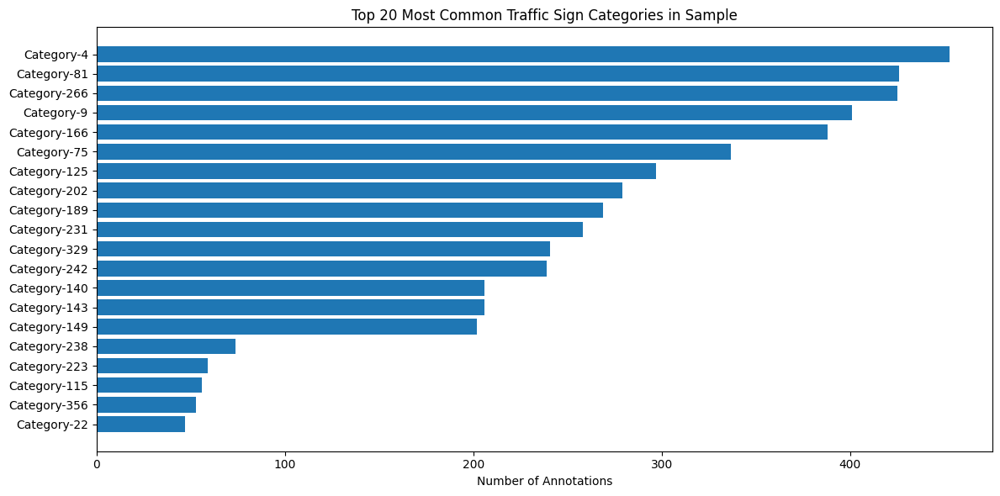


Top 15 Target Categories (used for sampling):
  Category   4: 453 annotations
  Category  81: 426 annotations
  Category 266: 425 annotations
  Category   9: 401 annotations
  Category 166: 388 annotations
  Category  75: 337 annotations
  Category 125: 297 annotations
  Category 202: 279 annotations
  Category 189: 269 annotations
  Category 231: 258 annotations
  Category 329: 241 annotations
  Category 242: 239 annotations
  Category 140: 206 annotations
  Category 143: 206 annotations
  Category 149: 202 annotations


In [5]:
# Top 20 most common categories in the sample
top_categories = category_counts.most_common(20)

fig, ax = plt.subplots(figsize=(12, 6))
cat_names = [category_id_to_name.get(cat_id, f'Category-{cat_id}') for cat_id, _ in top_categories]
counts = [count for _, count in top_categories]

ax.barh(range(len(cat_names)), counts)
ax.set_yticks(range(len(cat_names)))
ax.set_yticklabels(cat_names)
ax.set_xlabel('Number of Annotations')
ax.set_title('Top 20 Most Common Traffic Sign Categories in Sample')
ax.invert_yaxis()
plt.tight_layout()
plt.show()

print("\nTop 15 Target Categories (used for sampling):")
for cat_id, count in top_categories[:15]:
    print(f"  Category {cat_id:3d}: {count} annotations")

## Annotations per Image Distribution

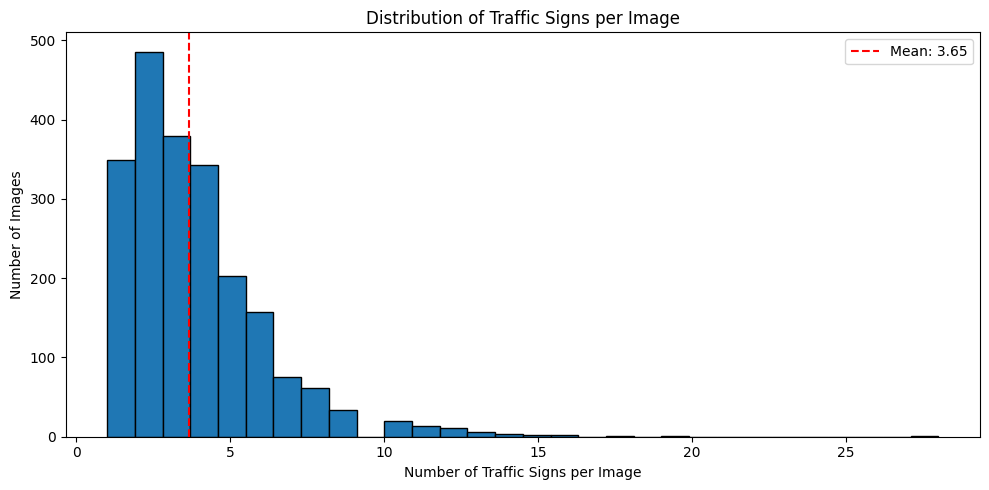

In [6]:
fig, ax = plt.subplots(figsize=(10, 5))
counts_list = list(image_annotation_counts.values())
ax.hist(counts_list, bins=30, edgecolor='black')
ax.set_xlabel('Number of Traffic Signs per Image')
ax.set_ylabel('Number of Images')
ax.set_title('Distribution of Traffic Signs per Image')
ax.axvline(np.mean(counts_list), color='red', linestyle='--', label=f'Mean: {np.mean(counts_list):.2f}')
ax.legend()
plt.tight_layout()
plt.show()

## Bounding Box Size Analysis

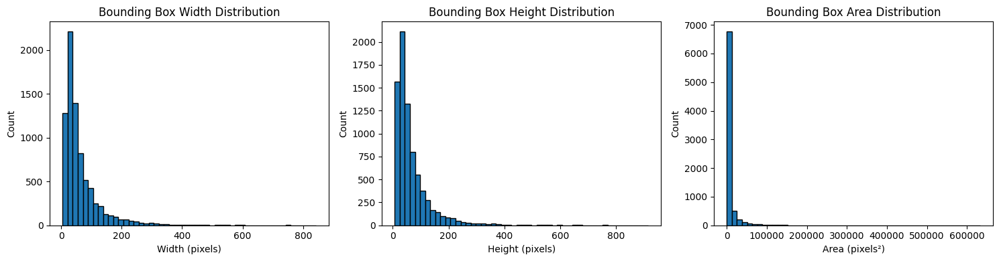


Bounding Box Statistics:
  Width  - Min: 5.0, Max: 843.0, Mean: 65.1
  Height - Min: 7.0, Max: 915.0, Mean: 68.3
  Area   - Min: 48.0, Max: 633180.0, Mean: 8728.6


In [7]:
# Analyze bbox sizes
bbox_widths = [ann['bbox'][2] for ann in coco_data['annotations']]
bbox_heights = [ann['bbox'][3] for ann in coco_data['annotations']]
bbox_areas = [ann['area'] for ann in coco_data['annotations']]

fig, axes = plt.subplots(1, 3, figsize=(15, 4))

axes[0].hist(bbox_widths, bins=50, edgecolor='black')
axes[0].set_xlabel('Width (pixels)')
axes[0].set_ylabel('Count')
axes[0].set_title('Bounding Box Width Distribution')

axes[1].hist(bbox_heights, bins=50, edgecolor='black')
axes[1].set_xlabel('Height (pixels)')
axes[1].set_ylabel('Count')
axes[1].set_title('Bounding Box Height Distribution')

axes[2].hist(bbox_areas, bins=50, edgecolor='black')
axes[2].set_xlabel('Area (pixels²)')
axes[2].set_ylabel('Count')
axes[2].set_title('Bounding Box Area Distribution')

plt.tight_layout()
plt.show()

print(f"\nBounding Box Statistics:")
print(f"  Width  - Min: {min(bbox_widths):.1f}, Max: {max(bbox_widths):.1f}, Mean: {np.mean(bbox_widths):.1f}")
print(f"  Height - Min: {min(bbox_heights):.1f}, Max: {max(bbox_heights):.1f}, Mean: {np.mean(bbox_heights):.1f}")
print(f"  Area   - Min: {min(bbox_areas):.1f}, Max: {max(bbox_areas):.1f}, Mean: {np.mean(bbox_areas):.1f}")

## Visualize Sample Images with Annotations

In [8]:
def visualize_image_with_annotations(image_id, coco_data, images_dir, category_id_to_name):
    """
    Visualize an image with its bounding box annotations
    """
    # Get image info
    img_info = next(img for img in coco_data['images'] if img['id'] == image_id)
    img_path = images_dir / img_info['file_name']
    
    # Load image
    img = Image.open(img_path)
    
    # Get annotations for this image
    annotations = [ann for ann in coco_data['annotations'] if ann['image_id'] == image_id]
    
    # Create figure
    fig, ax = plt.subplots(1, figsize=(12, 8))
    ax.imshow(img)
    
    # Generate random colors for each category
    category_colors = {}
    
    # Draw bounding boxes
    for ann in annotations:
        bbox = ann['bbox']  # [x, y, width, height]
        cat_id = ann['category_id']
        
        # Assign color for category
        if cat_id not in category_colors:
            category_colors[cat_id] = np.random.rand(3,)
        
        # Create rectangle
        rect = patches.Rectangle(
            (bbox[0], bbox[1]), bbox[2], bbox[3],
            linewidth=2, edgecolor=category_colors[cat_id], facecolor='none'
        )
        ax.add_patch(rect)
        
        # Add category label
        cat_name = category_id_to_name.get(cat_id, f'Cat-{cat_id}')
        ax.text(
            bbox[0], bbox[1] - 5,
            cat_name,
            color='white',
            fontsize=8,
            bbox=dict(boxstyle='round,pad=0.3', facecolor=category_colors[cat_id], alpha=0.7)
        )
    
    ax.set_title(f"Image: {img_info['file_name']} | Annotations: {len(annotations)}", fontsize=12)
    ax.axis('off')
    plt.tight_layout()
    plt.show()
    
    # Print annotation details
    print(f"\nAnnotations for {img_info['file_name']}:")
    for i, ann in enumerate(annotations, 1):
        cat_name = category_id_to_name.get(ann['category_id'], f"Cat-{ann['category_id']}")
        bbox = ann['bbox']
        print(f"  {i}. Category {ann['category_id']:3d}: bbox=[{bbox[0]:.0f}, {bbox[1]:.0f}, {bbox[2]:.0f}, {bbox[3]:.0f}], area={ann['area']:.0f}")

Visualizing 5 random images from the sample:


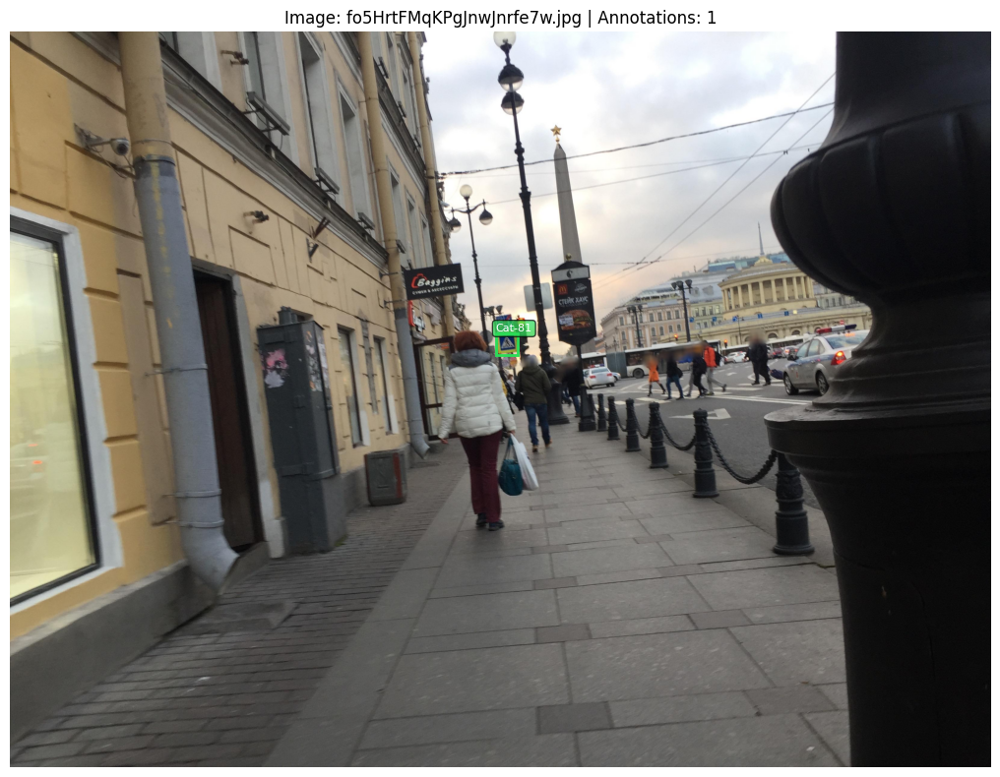


Annotations for fo5HrtFMqKPgJnwJnrfe7w.jpg:
  1. Category  81: bbox=[1616, 1002, 74, 72], area=5328


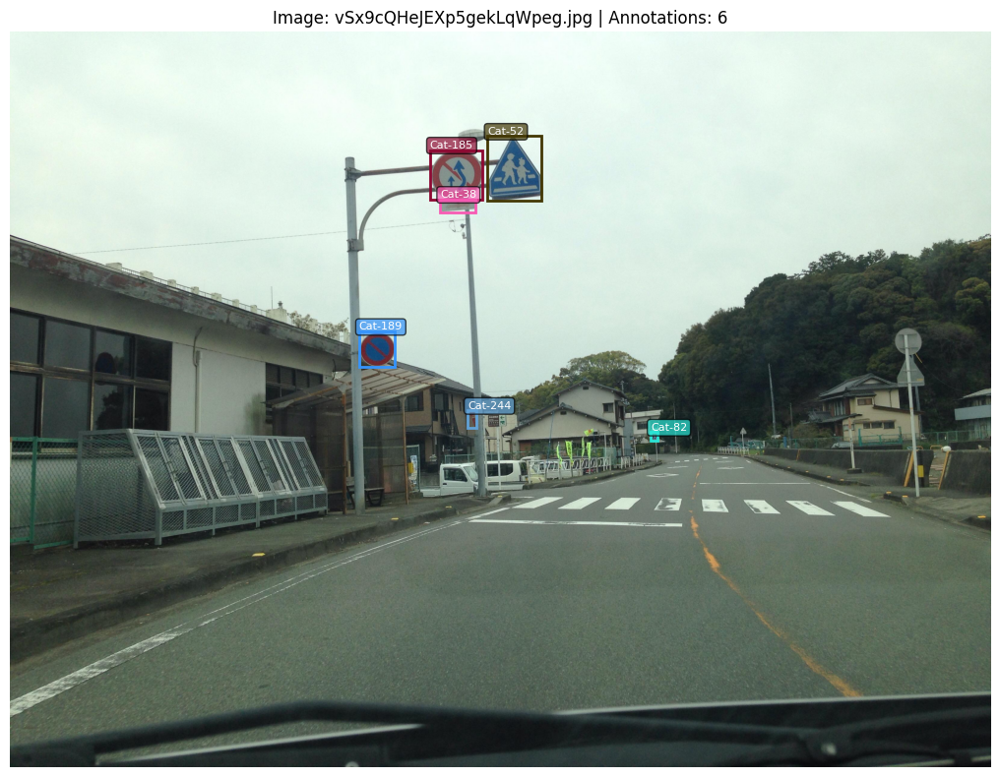


Annotations for vSx9cQHeJEXp5gekLqWpeg.jpg:
  1. Category 189: bbox=[1161, 997, 119, 117], area=13923
  2. Category 185: bbox=[1397, 393, 174, 166], area=28884
  3. Category  38: bbox=[1431, 557, 118, 45], area=5310
  4. Category  52: bbox=[1589, 347, 180, 216], area=38880
  5. Category  82: bbox=[2131, 1332, 24, 28], area=672
  6. Category 244: bbox=[1522, 1260, 31, 59], area=1829


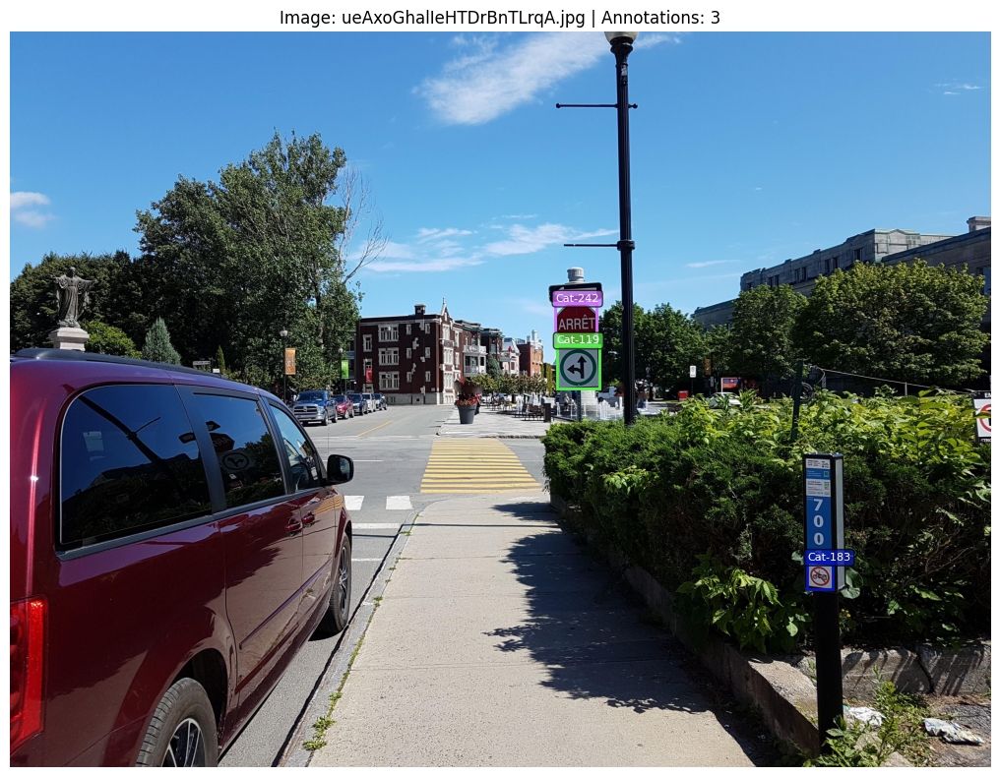


Annotations for ueAxoGhalIeHTDrBnTLrqA.jpg:
  1. Category 242: bbox=[2242, 1114, 170, 172], area=29240
  2. Category 119: bbox=[2247, 1287, 176, 181], area=31856
  3. Category 183: bbox=[3277, 2179, 103, 112], area=11536


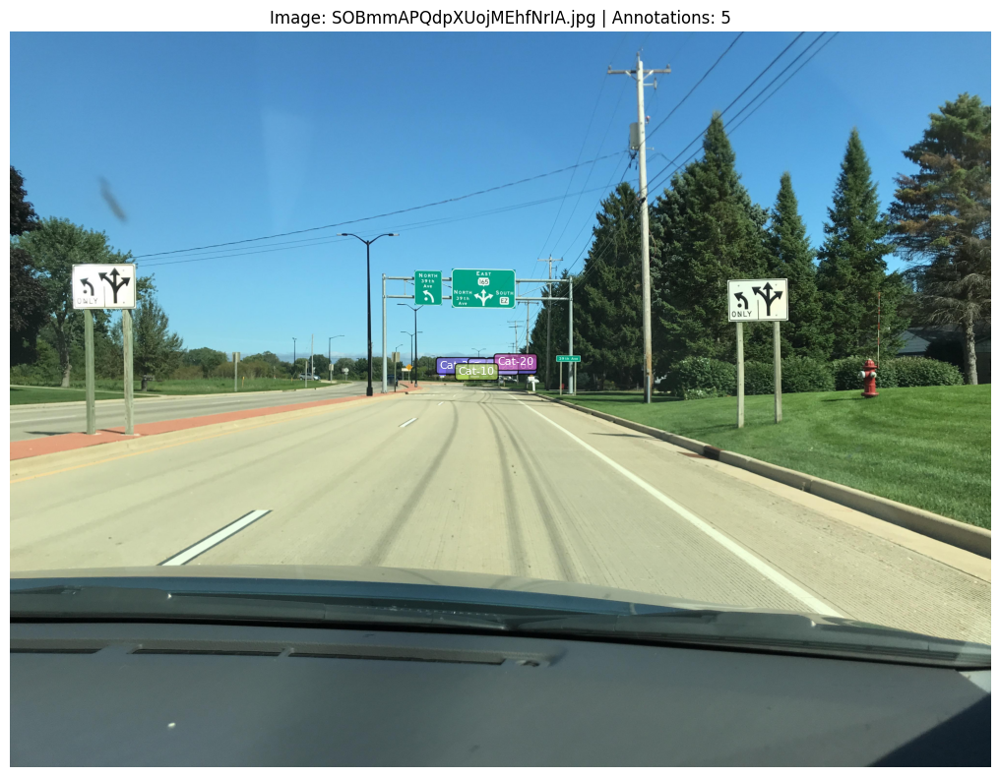


Annotations for SOBmmAPQdpXUojMEhfNrIA.jpg:
  1. Category 266: bbox=[1765, 1390, 18, 15], area=270
  2. Category 266: bbox=[1973, 1390, 16, 16], area=256
  3. Category 329: bbox=[1896, 1394, 24, 18], area=432
  4. Category  20: bbox=[2003, 1375, 18, 15], area=270
  5. Category  10: bbox=[1843, 1415, 34, 11], area=374


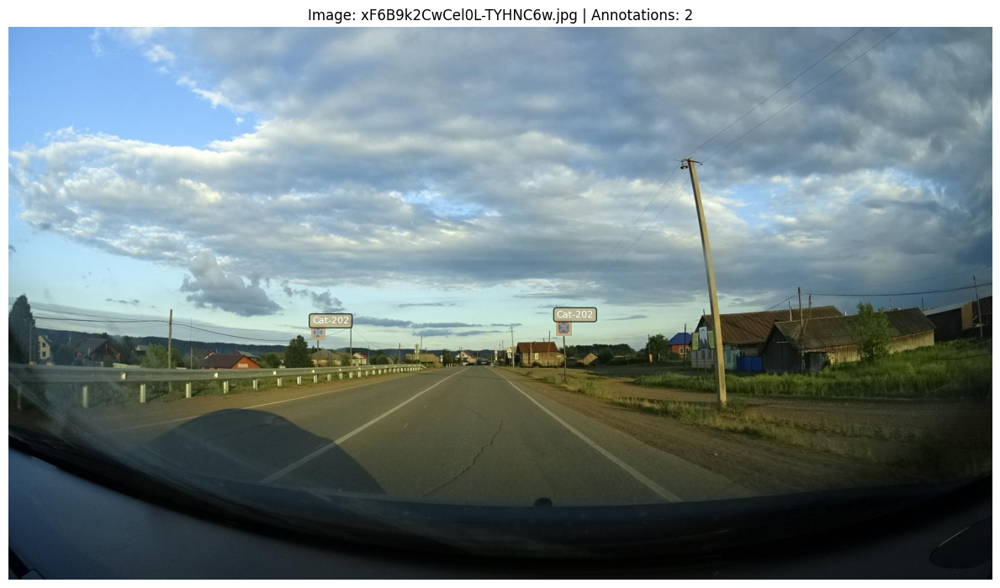


Annotations for xF6B9k2CwCel0L-TYHNC6w.jpg:
  1. Category 202: bbox=[1069, 572, 27, 29], area=783
  2. Category 202: bbox=[592, 584, 23, 25], area=575


In [9]:
# Visualize a few random images
num_samples = 5
sample_image_ids = random.sample([img['id'] for img in coco_data['images']], num_samples)

print(f"Visualizing {num_samples} random images from the sample:")
for img_id in sample_image_ids:
    visualize_image_with_annotations(img_id, coco_data, images_dir, category_id_to_name)

## Find Images with Most Annotations

Images with most traffic signs:

rI9mJoQ6toQtlEpjKljboQ.jpg: 28 traffic signs


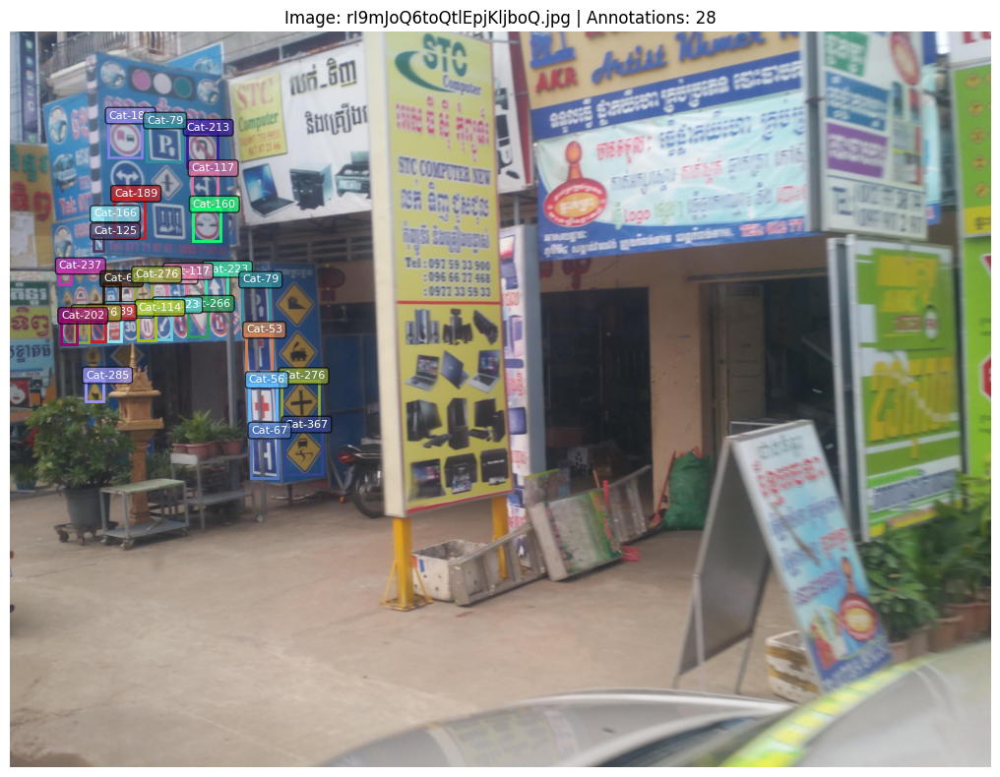


Annotations for rI9mJoQ6toQtlEpjKljboQ.jpg:
  1. Category 276: bbox=[1104, 1415, 151, 180], area=27180
  2. Category 266: bbox=[721, 1121, 80, 115], area=9200
  3. Category 117: bbox=[737, 571, 104, 121], area=12584
  4. Category 367: bbox=[1116, 1612, 152, 184], area=27968
  5. Category 188: bbox=[401, 357, 134, 153], area=20502
  6. Category 213: bbox=[717, 406, 124, 142], area=17608
  7. Category 285: bbox=[307, 1412, 71, 90], area=6390
  8. Category 160: bbox=[742, 717, 112, 132], area=14784
  9. Category  53: bbox=[959, 1228, 105, 159], area=16695
  10. Category 223: bbox=[794, 981, 89, 115], area=10235
  11. Category 123: bbox=[592, 1127, 61, 124], area=7564
  12. Category 237: bbox=[198, 968, 50, 59], area=2950
  13. Category  79: bbox=[943, 1024, 112, 169], area=18928
  14. Category  69: bbox=[379, 1020, 69, 107], area=7383
  15. Category 166: bbox=[396, 1146, 55, 113], area=6215
  16. Category 114: bbox=[521, 1138, 68, 115], area=7820
  17. Category  79: bbox=[555, 377, 143, 

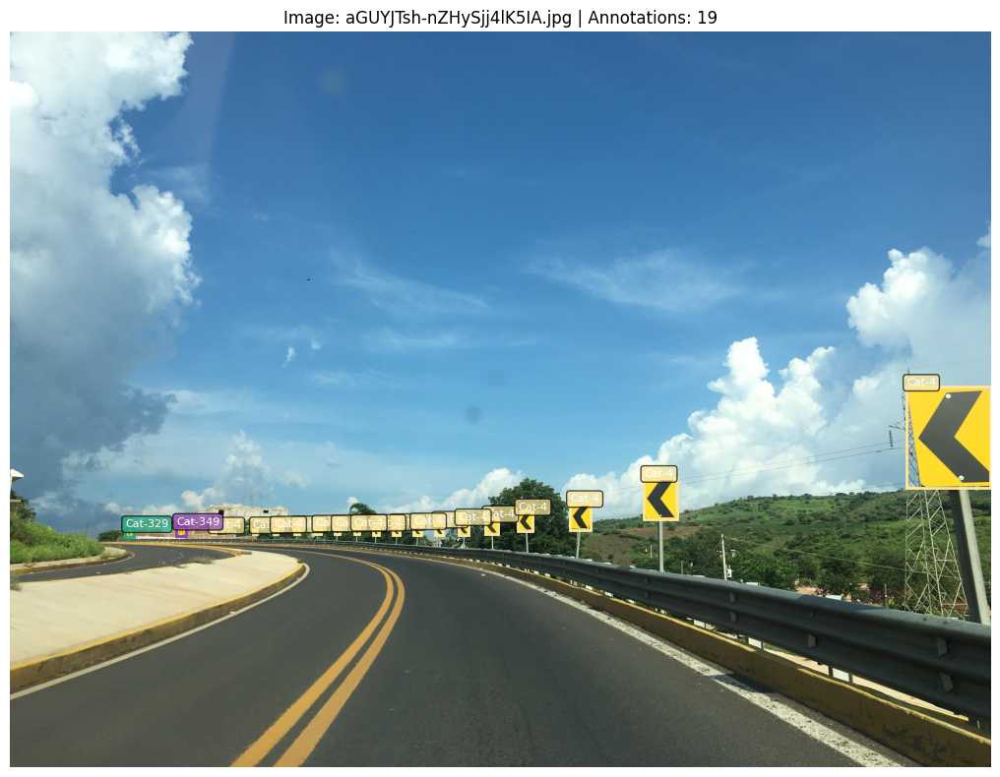


Annotations for aGUYJTsh-nZHySjj4lK5IA.jpg:
  1. Category   4: bbox=[1574, 2033, 29, 36], area=1044
  2. Category   4: bbox=[1747, 2023, 33, 44], area=1452
  3. Category   4: bbox=[2606, 1835, 134, 169], area=22646
  4. Category   4: bbox=[829, 2047, 14, 18], area=252
  5. Category   4: bbox=[1169, 2042, 19, 22], area=418
  6. Category 349: bbox=[683, 2032, 40, 41], area=1640
  7. Category   4: bbox=[998, 2046, 16, 19], area=304
  8. Category   4: bbox=[1255, 2039, 21, 27], area=567
  9. Category   4: bbox=[1954, 2000, 50, 63], area=3150
  10. Category   4: bbox=[1491, 2036, 25, 33], area=825
  11. Category   4: bbox=[1842, 2013, 42, 55], area=2310
  12. Category   4: bbox=[2088, 1971, 60, 80], area=4800
  13. Category   4: bbox=[1658, 2030, 32, 40], area=1280
  14. Category   4: bbox=[3684, 1460, 345, 414], area=142830
  15. Category   4: bbox=[1334, 2039, 20, 25], area=500
  16. Category 329: bbox=[473, 2042, 35, 36], area=1260
  17. Category   4: bbox=[1414, 2036, 22, 29], area=638

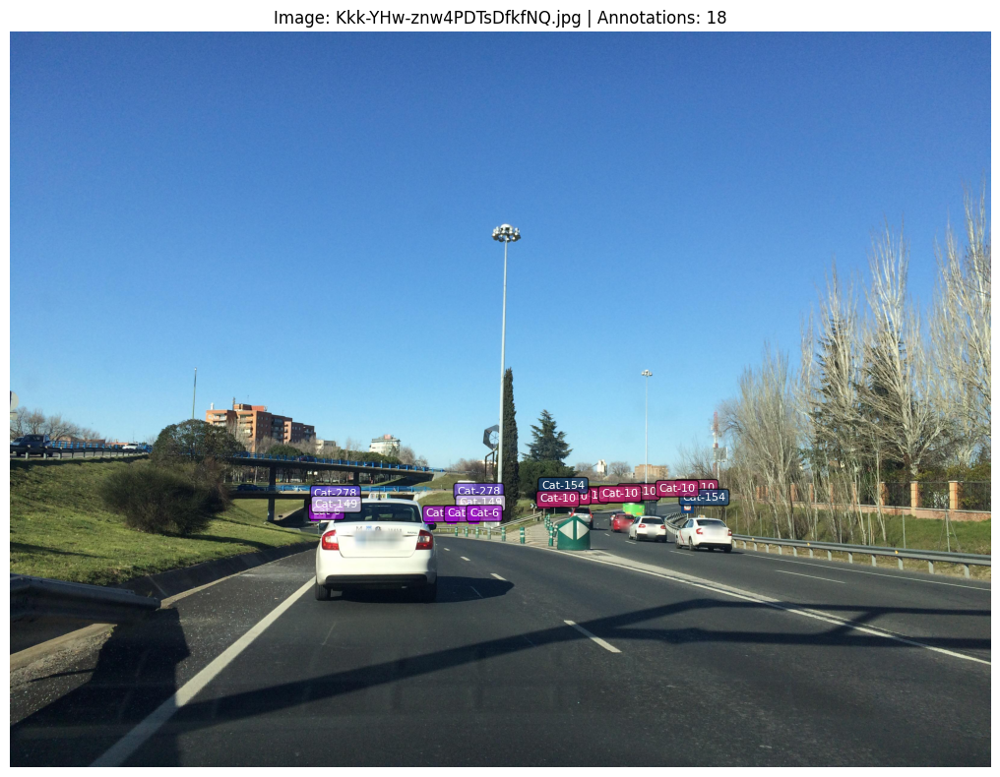


Annotations for Kkk-YHw-znw4PDTsDfkfNQ.jpg:
  1. Category  10: bbox=[2224, 1532, 16, 8], area=128
  2. Category   6: bbox=[1004, 1611, 16, 11], area=176
  3. Category 278: bbox=[1487, 1544, 37, 37], area=1369
  4. Category 149: bbox=[1493, 1583, 27, 25], area=675
  5. Category 154: bbox=[2237, 1564, 32, 31], area=992
  6. Category   6: bbox=[1384, 1619, 20, 13], area=260
  7. Category   6: bbox=[1455, 1619, 23, 13], area=299
  8. Category   6: bbox=[1529, 1617, 27, 14], area=378
  9. Category 278: bbox=[1010, 1552, 39, 36], area=1404
  10. Category  10: bbox=[2031, 1546, 15, 10], area=150
  11. Category  10: bbox=[1915, 1555, 18, 9], area=162
  12. Category  10: bbox=[1859, 1559, 22, 11], area=242
  13. Category  10: bbox=[1800, 1562, 23, 14], area=322
  14. Category 154: bbox=[1768, 1525, 29, 31], area=899
  15. Category  10: bbox=[1762, 1570, 28, 11], area=308
  16. Category  10: bbox=[2159, 1535, 16, 8], area=128
  17. Category  10: bbox=[1968, 1553, 19, 11], area=209
  18. Categor

In [10]:
# Get images with most annotations
top_annotated = image_annotation_counts.most_common(3)

print("Images with most traffic signs:")
for img_id, count in top_annotated:
    img_info = image_id_to_info[img_id]
    print(f"\n{img_info['file_name']}: {count} traffic signs")
    visualize_image_with_annotations(img_id, coco_data, images_dir, category_id_to_name)